![BCC](https://bccfilkom.net/static/assets/images/BCC-Logo.svg)

# Rainfall Predictions

# Methodology

Kemampuan kita untuk menggunakan data dalam proses pengambilan keputusan seringkali hilang atau tidak dimaksimalkan karena terlalu sering kita tidak memiliki pemahaman yang kuat tentang pertanyaan yang diajukan dan bagaimana cara mengaplikasikan data dengan benar untuk masalah yang sedang dihadapi. Penting untuk mempertimbangkannya karena terlalu sering ada godaan untuk mengabaikan metodologi dan langsung beralih ke solusi.

Pertama, kita mulai dengan menjelaskan apa itu metodologi. Metodologi adalah strategi umum yang memandu proses dan aktivitas dalam suatu domain tertentu. Metodologi tidak bergantung pada teknologi atau tools tertentu, dan juga bukan sekumpulan teknik atau resep. Sebaliknya, metodologi memberikan kerangka kerja bagi ilmuwan data tentang bagaimana melanjutkan dengan metode, proses, dan heuristik apa pun yang akan digunakan untuk mendapatkan jawaban atau hasil.

Jadi dalam proyek ini, kelompok kami akan menggunakan metodologi yang disebut *Foundational Methodology for Data Science*.

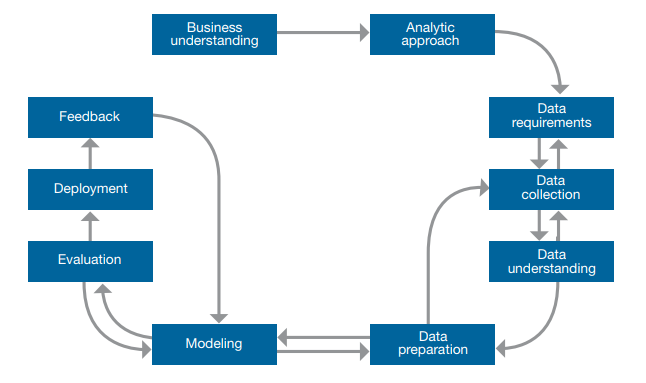

Foundational methodology for data science (Source: John Rollins, IBM)

# Business understanding

.

# Analytic approach

.

# Data collection

In [1]:
import warnings
warnings.filterwarnings('ignore')

# Basic Library
import warnings
import os
import numpy as np
np.random.seed(7)
import pandas as pd
import statistics
import math
from timeit import default_timer as timer

# Preprocessing Library
import vtreat
from scipy.stats.mstats import winsorize

# Visualization Library
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
from scipy import stats
import missingno as mno

# Fast EDA
from dataprep.eda import create_report

# Dimentionality Reduction & Normalization Library
from sklearn.preprocessing import StandardScaler

# Machine Learning Library
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
import pickle


# Model Evaluation Library
from sklearn.metrics import mean_squared_error



# Library setting
# Set the display option to show all columns
pd.set_option('display.max_columns', None)

In [2]:
# Downgrading numpy to 1.23 for shap
#!pip install numpy==1.23

In [3]:
# Check the version
print(f'Matplotlib: {matplotlib.__version__}')
print(f'pandas: {pd.__version__}')
print(f'numpy: {np.__version__}')

Matplotlib: 3.7.2
pandas: 1.5.3
numpy: 1.23.5


In [4]:
# Get all files in the designated directory
directory_path = r"D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23"

for dirpath, _, filenames in os.walk(directory_path):
    for filename in filenames:
        print(os.path.join(dirpath, filename))

D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.gitignore
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\README.md
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\COMMIT_EDITMSG
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\config
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\description
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\FETCH_HEAD
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\HEAD
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\index
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\ORIG_HEAD
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\packed-refs
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\hooks\applypatch-msg.sample
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\hooks\commit-msg.sample
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\hooks\fsmonito

In [5]:
# Use double backslashes or forward slashes in the file path
TRAIN_PATH = "../../datasets/train.csv"
TEST_PATH = "../../datasets/test.csv"
SAMPLE_SUBMISSION_PATH = "../../datasets/sample_submission.csv"

# Read the CSV file into a DataFrame
train_dat = pd.read_csv(TRAIN_PATH)
test_dat = pd.read_csv(TEST_PATH)

# Data preparation I

In [6]:
# Check unique value
cols = train_dat.columns

for col in cols:
    print(f"{col} \t\n-> number of unique val: {train_dat[col].nunique()} \n-> unique val: {train_dat[col].unique()} \n -------------------------------- \n")

datetime 	
-> number of unique val: 341880 
-> unique val: [ 283996800  284000400  284004000 ... 1514754000 1514757600 1514761200] 
 -------------------------------- 

datetime_iso 	
-> number of unique val: 341880 
-> unique val: ['1979-01-01 00:00:00+00:00' '1979-01-01 01:00:00+00:00'
 '1979-01-01 02:00:00+00:00' ... '2017-12-31 21:00:00+00:00'
 '2017-12-31 22:00:00+00:00' '2017-12-31 23:00:00+00:00'] 
 -------------------------------- 

time-zone 	
-> number of unique val: 1 
-> unique val: [28800] 
 -------------------------------- 

temp 	
-> number of unique val: 9406 
-> unique val: ['24.75 Celcius' '24.58 C' '26.6 Celcius' ... '136.06 °C' '33.48 Celcius'
 '34.32 C'] 
 -------------------------------- 

visibility 	
-> number of unique val: 12 
-> unique val: [nan 'unidentified' ' ' '-1m' 'unrecognized' 'unknown' '-1 km' '-1'
 'empty' 'undefined' '-1km' '-1 m' 'missing'] 
 -------------------------------- 

d_point 	
-> number of unique val: 6121 
-> unique val: ['23.89  C' '23.

In [7]:
train_dat.iloc[:3]

,datetime,datetime_iso,time-zone,temp,visibility,d_point,feels,min_temp,max_temp,prssr,sea_level,grnd_level,hum,wind_spd,wind_deg,rain_1h,rain_3h,snow_1h,snow_3h,clouds
0,283996800,1979-01-01 00:00:00+00:00,28800,24.75 Celcius,NaN,23.89 C,25.76 C,24.28,25.22°C,1012,undetermined,NaN,95,0.82,320.0 °,zero,0,NaN,NaN,100
1,284000400,1979-01-01 01:00:00+00:00,28800,24.58 C,NaN,23.73 C,25.57 C,23.99 C,25.26 C,1012,NaN,NaN,95,0.96 m/s,338.0°,0,0,0,0,100
2,284004000,1979-01-01 02:00:00+00:00,28800,26.6 Celcius,unidentified,24.06 C,26.6 C,26.1 C,27.39,1012,NaN,undetermined,86,1.22 m/s,339.0°,0,volume:zero,NaN,NaN,99


In [8]:
# temp
def prep_temp(temp):
    if isinstance(temp, str) :
        temp = temp.replace("Celcius", "")
        temp = temp.replace("C", "")
        temp = temp.replace("°", "")
        temp = temp.strip()
    return temp

def categorize_hour(hour) :
    if hour in [4,5]:
        return "dawn"
    elif hour in [6,7]:
        return "early morning"
    elif hour in [8,9,10]:
        return "late morning"
    elif hour in [11,12,13]:
        return "noon"
    elif hour in [14,15,16]:
        return "afternoon"
    elif hour in [17, 18,19]:
        return "evening"
    elif hour in [20, 21, 22]:
        return "night"
    elif hour in [23,0,1,2,3]:
        return "midnight"
    
def categorize_quarter(month) :
    if month in [1,2,3]:
        return "quarter 1"
    elif month in [4,5,6]:
        return "quarter 2"
    elif month in [7,8,9]:
        return "quarter 3"
    elif month in [10,11,12]:
        return "quarter 4"

# datetime -> dihapus karena redundant
train_dat.drop(columns=["datetime"], inplace=True)
test_dat.drop(columns=["datetime"], inplace=True)

# Convert the 'timestamp' column to a datetime object
train_dat['datetime_iso'] = pd.to_datetime(train_dat['datetime_iso'])
test_dat['datetime_iso'] = pd.to_datetime(test_dat['datetime_iso'])

# Extract year, month, day, and hour
# train_dat['year'] = train_dat['datetime_iso'].dt.year.astype(float)
train_dat['month'] = train_dat['datetime_iso'].dt.month.astype(float)
train_dat['day'] = train_dat['datetime_iso'].dt.day
train_dat['hour'] = train_dat['datetime_iso'].dt.hour
train_dat['year'] = train_dat['datetime_iso'].dt.year
train_dat['hour_cat'] = train_dat['hour'].apply(categorize_hour)
train_dat['quart_cat'] = train_dat['month'].apply(categorize_quarter)

train_dat['day_name'] = train_dat['datetime_iso'].dt.day_name()

train_dat['weekday'] = train_dat['day_name'].apply(lambda x: 0 if x in ['Saturday', 'Sunday'] else 1)
train_dat['weekend'] = train_dat['day_name'].apply(lambda x: 1 if x in ['Saturday', 'Sunday'] else 0)
train_dat['dayofweek'] = train_dat['datetime_iso'].dt.dayofweek
# train_dat["season"] = train_dat["month"].apply(lambda x: 0 if x in [4, 5, 6, 7, 8, 9] else 1) # 1 hujan 0 kemarau
train_dat.drop(columns=["day_name"], inplace=True)

# test_dat['year'] = test_dat['datetime_iso'].dt.year.astype(float)
test_dat['month'] = test_dat['datetime_iso'].dt.month.astype(float)
test_dat['day'] = test_dat['datetime_iso'].dt.day
test_dat['hour'] = test_dat['datetime_iso'].dt.hour
test_dat['year'] = test_dat['datetime_iso'].dt.year
test_dat['hour_cat'] = test_dat['hour'].apply(categorize_hour)
test_dat['quart_cat'] = test_dat['month'].apply(categorize_quarter)

test_dat['day_name'] = test_dat['datetime_iso'].dt.day_name()

test_dat['weekday'] = test_dat['day_name'].apply(lambda x: 0 if x in ['Saturday', 'Sunday'] else 1)
test_dat['weekend'] = test_dat['day_name'].apply(lambda x: 1 if x in ['Saturday', 'Sunday'] else 0)
test_dat['dayofweek'] = test_dat['datetime_iso'].dt.dayofweek
# test_dat["season"] = test_dat["month"].apply(lambda x: 0 if x in [4, 5, 6, 7, 8, 9] else 1) # 1 hujan 0 kemarau
test_dat.drop(columns=["day_name"], inplace=True)

train_dat.drop(columns=["datetime_iso"], inplace=True)
test_dat.drop(columns=["datetime_iso"], inplace=True)

# time-zone -> dihapus karena data bukan unique
train_dat.drop(columns=["time-zone"], inplace=True)
test_dat.drop(columns=["time-zone"], inplace=True)

# prssr
def prep_prssr(prssr):
    if isinstance(prssr, str):
        prssr = prssr.replace("hPa.", "")
        prssr = prssr.replace("hPa", "")
        prssr = prssr.strip()
    return prssr

# hum
def prep_hum(hum):
    if isinstance(hum, str):
        hum = hum.replace("%", "")
        hum = hum.strip()
    return hum

# wind_spd & wind_deg
def prep_wind(wind):
    if isinstance(wind, str):
        wind = wind.replace("m/s", "")
        wind = wind.replace("°", "")
        wind = wind.strip()
    return wind

# rain_1h
def prep_rain_1h(rain):
    if isinstance(rain, str):
        rain = rain.replace("mm", "")
        rain = rain.replace("zero", "0")
        rain = rain.replace(" ", "0")
        rain = rain.strip()
        try:
            float(rain)
            return rain
        except:
            new_rain = 0.0
            return new_rain
    return rain

# rain_3h -> 0 artinya ga hujan
def prep_rain_3h(rain):
    if isinstance(rain, str):
        rain = rain.replace("milimeter", "")
        rain = rain.replace("mm", "")
        rain = rain.replace("no-rain", "0")
        rain = rain.replace("volume:0", "0")
        rain = rain.replace("nol", "0")
        rain = rain.replace("no_rain", "0")
        rain = rain.replace("volume:zero", "0")
        rain = rain.replace("zero", "0")
        rain = rain.strip()
    return rain

# snow_1h
def prep_snow(snow):
    if isinstance(snow, str):
        snow = snow.replace("milimeter", "")
        snow = snow.replace("mm", "")
        snow = snow.replace("no-snow", "0")
        snow = snow.replace("volume:0", "0")
        snow = snow.replace("nol", "0")
        snow = snow.replace("no_snow", "0")
        snow = snow.replace("volume:zero", "0")
        snow = snow.replace("zero", "0")
        snow = snow.strip()
    return snow

# clouds
def prep_clouds(clouds):
    if isinstance(clouds, str):
        clouds = clouds.replace("%", "")
        clouds = clouds.strip()
    return clouds

preped_train = train_dat.copy()
preped_test = test_dat.copy()

# Prepping temp column --> including temp, d_point, feels, min_temp, max_temp
for column in ['temp','d_point','feels','min_temp','max_temp']:
    preped_train[column] = preped_train[column].apply(lambda x: prep_temp(x))
    preped_test[column] = preped_test[column].apply(lambda x: prep_temp(x))

# Prepping prssr column
for column in ['prssr']:
    preped_train[column] = preped_train[column].apply(lambda x:prep_prssr(x))
    preped_test[column] = preped_test[column].apply(lambda x:prep_prssr(x))

# Prepping hum column
for column in ['hum']:
    preped_train[column] = preped_train[column].apply(lambda x:prep_hum(x))
    preped_test[column] = preped_test[column].apply(lambda x:prep_hum(x))

# Prepping wind column --> including wind_spd, wind_deg
for column in ['wind_spd', 'wind_deg']:
    preped_train[column] = preped_train[column].apply(lambda x:prep_wind(x))
    preped_test[column] = preped_test[column].apply(lambda x:prep_wind(x))

# Prepping rain_1h
for column in ['rain_1h']:
    preped_train[column] = preped_train[column].apply(lambda x:prep_rain_1h(x))

# Prepping rain_3h column
for column in ['rain_3h']:
    preped_train[column] = preped_train[column].apply(lambda x:prep_rain_3h(x))
    preped_test[column] = preped_test[column].apply(lambda x:prep_rain_3h(x))

# Prepping snow column --> including snow_1h, snow_3h
for column in ['snow_1h', 'snow_3h']:
    preped_train[column] = preped_train[column].apply(lambda x:prep_snow(x))
    preped_test[column] = preped_test[column].apply(lambda x:prep_snow(x))

# Prepping clunds column
for column in ['clouds']:
    preped_train[column] = preped_train[column].apply(lambda x:prep_clouds(x))
    preped_test[column] = preped_test[column].apply(lambda x:prep_clouds(x))

preped_train['month_seasonal']= np.sin(0.6 * (preped_train['month'] - 1)) + 1
preped_test['month_seasonal']= np.sin(0.6 * (preped_test['month'] - 1)) + 1

preped_train['rain_1h'] = preped_train['rain_1h'].astype(float)

preped_train['wind_deg'] = preped_train['wind_deg'].astype(float) % 360
preped_test['wind_deg'] = preped_test['wind_deg'].astype(float) % 360

preped_train.drop(['day'], axis=1, inplace=True)
preped_test.drop(['day'], axis=1, inplace=True)

def categorize_wind_deg(deg) :
    if deg <= 22.5 :
        return 'north'
    elif deg > 22.5 and deg <= 67.5 :
        return 'north east'
    elif deg > 67.5 and deg <= 112.5 :
        return 'east'
    elif deg > 112.5 and deg <= 157.5 :
        return 'south east'
    elif deg > 157.5 and deg <= 202.5 :
        return 'south'
    elif deg > 202.5 and deg <= 247.5 :
        return 'south west'
    elif deg > 247.5 and deg <= 292.5 :
        return 'west'
    elif deg > 292.5 and deg <= 337.5 :
        return 'north west'
    elif deg > 337.5 :
        return 'north'

preped_train['wind_deg_cat'] = preped_train['wind_deg'].apply(lambda x : categorize_wind_deg(x))
preped_test['wind_deg_cat'] = preped_train['wind_deg'].apply(lambda x : categorize_wind_deg(x))

In [9]:
# Check unique value
cols = preped_train.columns

for col in cols:
    print(f"{col} \t\n-> number of unique val: {preped_train[col].nunique()} \n-> unique val: {preped_train[col].unique()} \n  --------------------------------  \n")

temp 	
-> number of unique val: 2206 
-> unique val: ['24.75' '24.58' '26.6' ... '158.6' '159.75' '34.32'] 
  --------------------------------  

visibility 	
-> number of unique val: 12 
-> unique val: [nan 'unidentified' ' ' '-1m' 'unrecognized' 'unknown' '-1 km' '-1'
 'empty' 'undefined' '-1km' '-1 m' 'missing'] 
  --------------------------------  

d_point 	
-> number of unique val: 1519 
-> unique val: ['23.89' '23.73' '24.06' ... '28.08' '28.69' '28.53'] 
  --------------------------------  

feels 	
-> number of unique val: 2805 
-> unique val: ['25.76' '25.57' '26.6' ... '41.32' '187.52' '189.53'] 
  --------------------------------  

min_temp 	
-> number of unique val: 2107 
-> unique val: ['24.28' '23.99' '26.1' ... '149.19' '146.78' '148.74'] 
  --------------------------------  

max_temp 	
-> number of unique val: 2307 
-> unique val: ['25.22' '25.26' '27.39' ... '35.4' '169.91' '177.66'] 
  --------------------------------  

prssr 	
-> number of unique val: 47 
-> uniq

## Making sure the datatypes are correct

* Numerical columns --> int or float
* Categorical columns --> object

In [10]:
preped_train.dtypes

temp               object
visibility         object
d_point            object
feels              object
min_temp           object
max_temp           object
prssr              object
sea_level          object
grnd_level         object
hum                object
wind_spd           object
wind_deg          float64
rain_1h           float64
rain_3h            object
snow_1h            object
snow_3h            object
clouds             object
month             float64
hour                int64
year                int64
hour_cat           object
quart_cat          object
weekday             int64
weekend             int64
dayofweek           int64
month_seasonal    float64
wind_deg_cat       object
dtype: object

* `temp` should be numerical(float).
* `visibility` should be normal categorical --> tetapi ada kemungkinan ordered categorical.
* `d_point` should be numerical(float).
* `feels` should be numerical(float).
* `min_temp` should be numerical(float).
* `max_temp` should be numerical(float).
* `prssr` should be numerical(float).
* `hum` should be numerical(float).
* `wind_spd` should be numerical(float).
* `wind_deg` should be numerical(float).
* `rain_1h` should be numerical(float) --> target variable.
* `rain_3h` should be numerical(float).
* `snow_1h` should be numerical(float).
* `snow_3h` should be numerical(float).
* `clouds` should be numerical(float).
* `year` should be normal categorical.
* `month` should be normal categorical.
* `hour` should be normal categorical.

In [11]:
# Changing to `object` data type for normal categorical data

# no year
cat_cols = ['visibility', 'sea_level', 'grnd_level', 'hour', 'hour_cat', 'wind_deg_cat']

preped_train[cat_cols] = preped_train[cat_cols].astype('object')
preped_test[cat_cols] = preped_train[cat_cols].astype('object')

# di num_cols_test ga ada rain_1h
num_cols_train = ['temp', 'd_point', 'feels', 'min_temp', 'max_temp', 'prssr', 'hum', 'wind_spd', 'wind_deg', 'rain_1h', 'rain_3h', 'snow_1h', 'snow_3h', 'clouds', 'month']
num_cols_test = ['temp', 'd_point', 'feels', 'min_temp', 'max_temp', 'prssr', 'hum', 'wind_spd', 'wind_deg', 'rain_3h', 'snow_1h', 'snow_3h', 'clouds', 'month']

preped_train[num_cols_train] = preped_train[num_cols_train].astype('float')
preped_test[num_cols_test] = preped_test[num_cols_test].astype('float')

In [12]:
preped_train.dtypes

temp              float64
visibility         object
d_point           float64
feels             float64
min_temp          float64
max_temp          float64
prssr             float64
sea_level          object
grnd_level         object
hum               float64
wind_spd          float64
wind_deg          float64
rain_1h           float64
rain_3h           float64
snow_1h           float64
snow_3h           float64
clouds            float64
month             float64
hour               object
year                int64
hour_cat           object
quart_cat          object
weekday             int64
weekend             int64
dayofweek           int64
month_seasonal    float64
wind_deg_cat       object
dtype: object

# Data understanding

## Fast EDA

### DataPrep

### ydata_profiling

## Descriptive Statistics

In [13]:
# statistics of numerical columns
preped_train.select_dtypes(exclude='object').describe().T

,count,mean,std,min,25%,50%,75%,max
temp,341880.0,28.296996,13.325830,21.550000,24.980000,26.20,28.390000,177.260000
d_point,341880.0,26.056234,12.080483,13.960000,23.950000,24.57,25.240000,141.590000
feels,341880.0,31.092778,15.228520,22.350000,25.990000,26.65,33.370000,202.710000
min_temp,341880.0,27.483902,12.924432,14.120000,24.250000,25.48,27.640000,162.920000
max_temp,341880.0,29.359565,13.802332,22.370000,25.970000,27.27,29.310000,187.170000
prssr,341880.0,1070.965439,494.701076,1001.000000,1009.000000,1010.00,1011.000000,5115.510000
hum,341880.0,94.221361,44.888444,29.000000,83.000000,92.00,96.000000,503.000000
wind_spd,341880.0,1.474819,1.104015,0.000000,0.880000,1.27,1.800000,25.000000
wind_deg,341880.0,198.152385,95.877356,0.000000,146.000000,202.00,275.000000,359.290000
rain_1h,341880.0,0.338298,0.953114,-1.000000,0.000000,0.00,0.230000,27.100000


- `temp` --> max mencapai 177(terlalu tinggi)
- `d_point` --> max mencapai 141(terlalu tinggi)
- `rain_1h` --> seharusnya tidak boleh mencapai angka -1.00
- `prssr` --> mean berada di nilai 1070 namun terdapat beberapa record data yang mencapai nilai ~5000

In [14]:
num_col_aneh = ["prssr", "wind_deg", "max_temp", "feels",
                "hum", "d_point", "temp", "min_temp", "wind_spd"]

MAX_TEMP = 50
MAX_HUM = 150
MAX_MAX_TEMP = 50
MAX_FEELS = 40
MAX_PRESSURE = 1200
MAX_MIN_TENP = 60
MAX_D_POINT = 30


preped_train = preped_train[preped_train["max_temp"] < MAX_MAX_TEMP]
preped_train = preped_train[preped_train["hum"] < MAX_HUM]
preped_train = preped_train[preped_train["feels"] < MAX_FEELS]
preped_train = preped_train[preped_train["prssr"] < MAX_PRESSURE]
preped_train = preped_train[preped_train["min_temp"] < MAX_MIN_TENP]
preped_train = preped_train[preped_train["temp"] < MAX_TEMP]
preped_train = preped_train[preped_train["d_point"] < MAX_D_POINT]

## Univariate Analysis

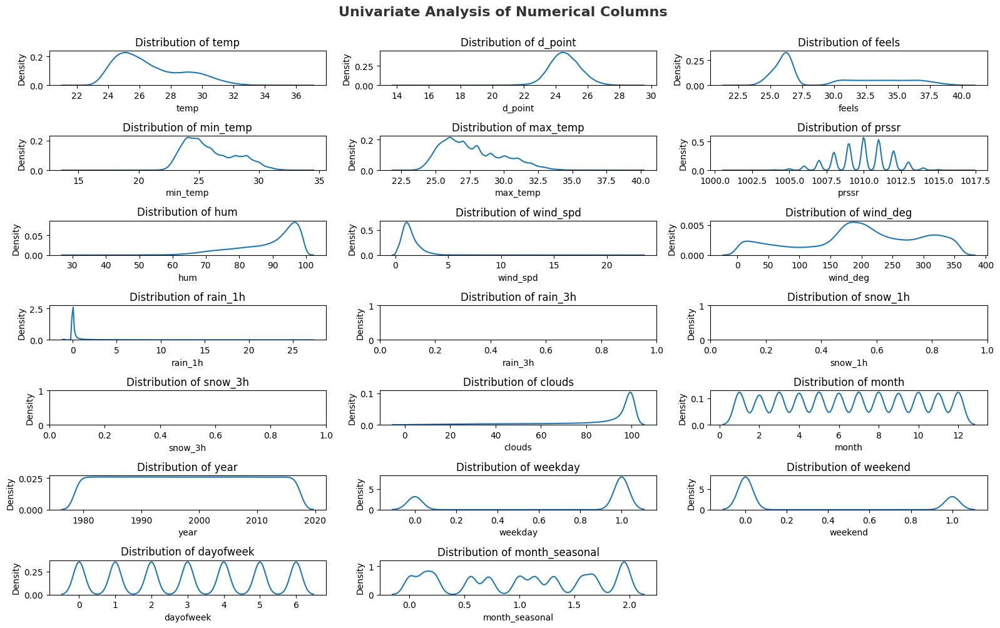

In [15]:
def univariate_analysis(preped_train, height=10):
    # Filter the DataFrame to include only numerical columns
    numerical_columns = preped_train.select_dtypes(include=['number'])
    
    # Determine the number of rows and columns for subplots dynamically
    num_numerical_cols = len(numerical_columns.columns)
    num_subplot_cols = 3  # Number of columns for subplots
    
    num_subplot_rows = (num_numerical_cols + num_subplot_cols - 1) // num_subplot_cols  # Calculate number of rows
    
    # Create subplots
    plt.figure(figsize=(16, height))
    plt.suptitle('Univariate Analysis of Numerical Columns', fontsize=16, fontweight='bold', alpha=0.8, y=1.)
    for i, column in enumerate(numerical_columns.columns):
        plt.subplot(num_subplot_rows, num_subplot_cols, i + 1)
        sns.kdeplot(data=numerical_columns[column])
        plt.title(f'Distribution of {column}')
    
    plt.tight_layout()
    plt.show()

univariate_analysis(preped_train, height=10)

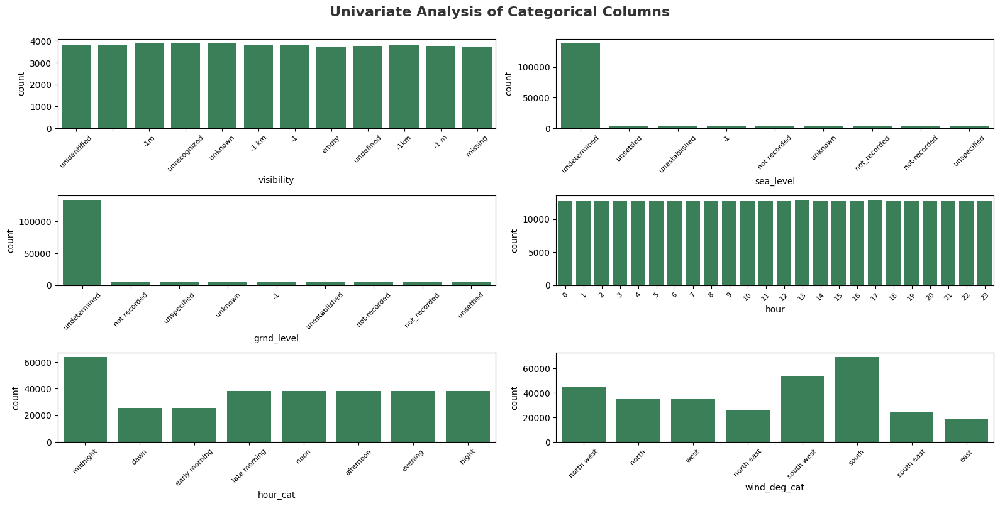

In [16]:
# categorical columns
plt.figure(figsize=(16, 8))
plt.suptitle('Univariate Analysis of Categorical Columns', fontsize=16, fontweight='bold', alpha=0.8, y=1.)
num_cat_cols = len(cat_cols)
num_rows = (num_cat_cols + 1) // 2  # Calculate the number of rows needed for 2 columns
for i in range(0, num_cat_cols):
    plt.subplot(num_rows, 2, i+1)  # Use 2 columns
    sns.countplot(x=preped_train[cat_cols[i]], color='seagreen')
    plt.xticks(rotation=45, fontsize=8)  # Rotate x-axis labels by 45 degrees and set fontsize
    plt.tight_layout()

# If there are more than 6 categorical columns, you can decide how to handle them.
# The number of rows will adjust accordingly for 2 columns.

<Axes: >

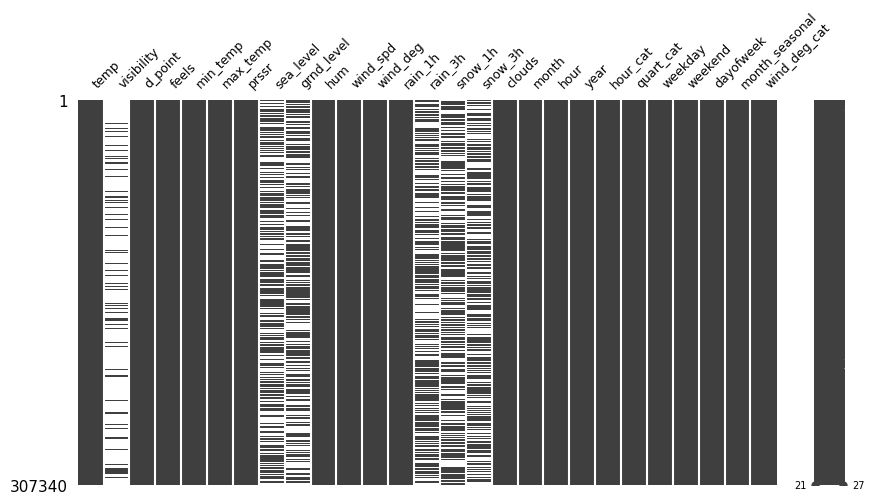

In [17]:
mno.matrix(preped_train, figsize=(10, 5), fontsize=9)

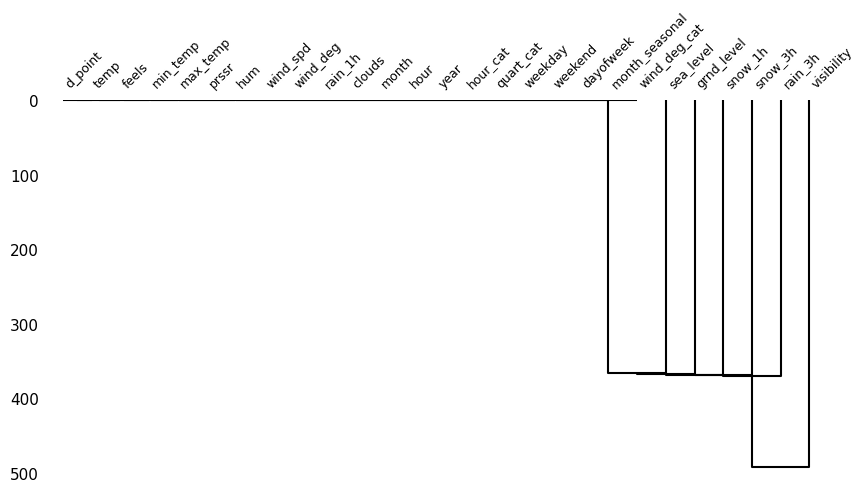

In [18]:
mno.dendrogram(preped_train, figsize=(10,5), fontsize=9);

<Axes: >

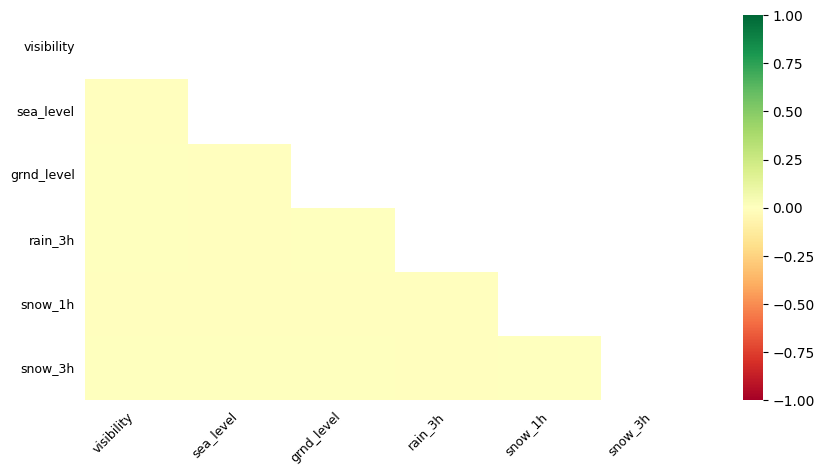

In [19]:
mno.heatmap(preped_train, cmap="RdYlGn", figsize=(10, 5), fontsize=9)

Text(0.5, 0, 'Years')

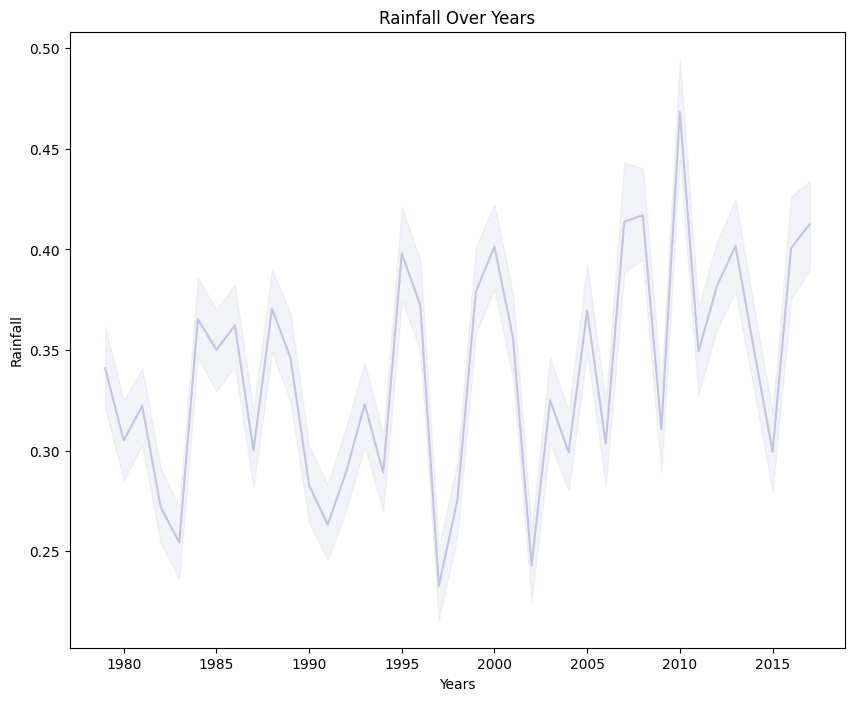

In [20]:
# Plotting a lineplot rainfall over years
plt.figure(figsize=(10,8))
Time_series=sns.lineplot(x=preped_train['year'], y="rain_1h", data=preped_train,color="#C2C4E2")
Time_series.set_title("Rainfall Over Years")
Time_series.set_ylabel("Rainfall")
Time_series.set_xlabel("Years")

# Data preparation II

Pay attention to the dataset before and after

## Feature Engineering

In [ ]:
# datetime feature engineering
# days of the week
cycle = 7
preped_train['weekday_sin'] = np.sin(2 * np.pi * preped_train['datetime_iso'].dt.dayofweek / cycle)
preped_train['weekday_cos'] = np.cos(2 * np.pi * preped_train['datetime_iso'].dt.dayofweek / cycle)
preped_test['weekday_sin'] = np.sin(2 * np.pi * preped_test['datetime_iso'].dt.dayofweek / cycle)
preped_test['weekday_cos'] = np.cos(2 * np.pi * preped_test['datetime_iso'].dt.dayofweek / cycle)

# Create a mapping of months to seasons (dry and wet)
month_to_season = {
    1: 'wet',   # January
    2: 'wet',   # February
    3: 'wet',   # March
    4: 'wet',   # April
    5: 'dry',   # May (Start of dry season)
    6: 'dry',   # June
    7: 'dry',   # July
    8: 'dry',   # August
    9: 'dry',   # September
    10: 'wet',  # October
    11: 'wet',  # November
    12: 'wet'   # December
}

# Map the month to the season for each datetime value
preped_train['season'] = preped_train['datetime_iso'].dt.month.map(month_to_season)
preped_test['season'] = preped_test['datetime_iso'].dt.month.map(month_to_season)

preped_train['season'] = preped_train['season'].astype('category')
preped_test['season'] = preped_test['season'].astype('category')

# Create binary indicator columns for dry and wet seasons
preped_train['dry_season'] = (preped_train['season'] == 'dry').astype(int)
preped_train['wet_season'] = (preped_train['season'] == 'wet').astype(int)
preped_test['dry_season'] = (preped_test['season'] == 'dry').astype(int)
preped_test['wet_season'] = (preped_test['season'] == 'wet').astype(int)

# Karena sudah di encode di dry_season & wet_season, `season` bisa dihapus
preped_train.drop(columns=['season'], inplace=True)
preped_test.drop(columns=['season'], inplace=True)

# Karena datetime_iso sekiranya sudah ga dipake, di drop
preped_train.drop(columns=["datetime_iso"], inplace=True)
preped_test.drop(columns=["datetime_iso"], inplace=True)

# feature engineering : cloudy => 1 if yes (>70), 0 if no (<=70) 
preped_train['cloudy'] = preped_train['clouds'].apply(lambda x: 1 if x > 70 else 0)
preped_test['cloudy'] = preped_test['clouds'].apply(lambda x: 1 if x > 70 else 0)

# feature engineering : temp_range => max_temp - min_temp
preped_train['temp_range'] = preped_train['max_temp'] - preped_train['min_temp']
preped_test['temp_range'] = preped_test['max_temp'] - preped_test['min_temp']

# feature engineering : hot_day => 1 if yes (>25), 0 if no (<=25) 
preped_train['hot_day'] = preped_train['temp'].apply(lambda x: 1 if x > 25 else 0)
preped_test['hot_day'] = preped_test['temp'].apply(lambda x: 1 if x > 25 else 0)

# win deg nya di anu pake modulus
preped_train["wind_deg"] = preped_train["wind_deg"] \
                                .apply(lambda x: x % 360 if x > 360 else x)
preped_test["wind_deg"] = preped_test["wind_deg"] \
                                .apply(lambda x: x % 360 if x > 360 else x)

# babai rain_1h < 0
preped_train = preped_train[preped_train["rain_1h"] >= 0]

## Winsorizing

In [ ]:
left_skewed = ['clouds']
right_skewed = ['temp', 'd_point', 'feels', 'min_temp', 'max_temp', 'prssr', 'hum', 'wind_spd', 'rain_1h']
right_skewed_test = ['temp', 'd_point', 'feels', 'min_temp', 'max_temp', 'prssr', 'hum', 'wind_spd']        # tanpa rain_1h

for column in left_skewed:
    preped_train[column] = winsorize(preped_train[column], limits=[0.020, 0.000])
    preped_test[column] = winsorize(preped_test[column], limits=[0.020, 0.000])

for column in right_skewed:
    preped_train[column] = winsorize(preped_train[column], limits=[0.000, 0.010])

for column in right_skewed_test:
    preped_test[column] = winsorize(preped_test[column], limits=[0.000, 0.010])

Data distribution after winsorizing

In [ ]:
univariate_analysis(preped_train)

## Encode categorical feature

Karena aku pake encoding-nya vtreat jadi hanya perlu ngubah kolom-nya ke tipe string atau object

In [ ]:
preped_train.dtypes

In [ ]:
cat_cols = ['visibility', 'sea_level', 'grnd_level', 'year', 'month', 'day', 'hour', 'hot_day']

# Convert columns to string data type
preped_train[cat_cols] = preped_train[cat_cols].astype(str)
preped_test[cat_cols] = preped_test[cat_cols].astype(str)

In [ ]:
preped_train.dtypes

In [ ]:
preped_test.dtypes

## vtreat

In [ ]:
transform = vtreat.NumericOutcomeTreatment(
    outcome_name="rain_1h",
    params=vtreat.vtreat_parameters({
        "missingness_imputation": np.mean,
        "filter_to_recommended": False     # False == pake semua fitur, kalau True cuman yang di recommended aja yang dipake
    })
)

transformed_train = transform.fit_transform(preped_train)
transformed_test = transform.transform(preped_test)
transform.score_frame_

univariate_analysis(transformed_train, height=25)

In [ ]:
transformed_train.shape

In [ ]:
transformed_train.iloc[:3]

In [ ]:
transformed_test.iloc[:3]

## PyCaret

## Train-Test-Validation Split

In [ ]:
from fast_ml.model_development import train_valid_test_split

X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(
                                        transformed_train,
                                        target = 'rain_1h',
                                        train_size=0.7, valid_size=0.15, test_size=0.15, random_state=7)

## Feature Scaling

In [ ]:
# 'scaler' buat Machine Learning I
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Jangan lupa scaling full data training juga
# Using transformed_train instead of splitted X_train
full_train = transformed_train.drop('rain_1h', axis=1)
full_target = transformed_train['rain_1h']

scaler_full = StandardScaler()
full_train = scaler_full.fit_transform(full_train)
full_test = scaler_full.transform(transformed_test)

# Machine Learning I

In [ ]:
params = {
        'iterations': 35000,
        'eval_metric': "RMSE",
        'task_type': "GPU",
        'verbose':True,
        'od_type':'Iter'}

cat_regressor = CatBoostRegressor(**params)

cat_regressor.fit(X_train, y_train, plot=True);

y_pred = cat_regressor.predict(X_test)
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))

## PyCaret ML

# Machine Learning II (Using full training dataset)

In [ ]:
xgb_regressor = XGBRegressor()
lgbm_regressor = LGBMRegressor()

In [ ]:
cat_regressor.fit(full_train, full_target, plot=True)

In [ ]:
xgb_regressor.fit(full_train, full_target)

In [ ]:
lgbm_regressor.fit(full_train, full_target)

In [ ]:
cat_y_pred = cat_regressor.predict(X_test)
xgb_y_pred = xgb_regressor.predict(X_test)
lgbm_y_pred = lgbm_regressor.predict(X_test)

ensembled_y_pred = (
   ( 0.6 * cat_y_pred ) +
   ( 0.1 * xgb_y_pred ) +
   ( 0.3 * lgbm_y_pred ) 
)

print('RMSE:', np.sqrt(mean_squared_error(y_test, ensembled_y_pred)))

# Evaluation

## Explainable AI

Explainable AI is a research field on ML interpretability techniques whose aims are to understand machine learning model predictions and explain them in human and understandable terms **to build trust with stakeholders**.

- *Interpretability* focuses on model understanding techniques.
- While *explainability* more broadly focuses on model explanations and the interface for translating these explanations in human, understandable terms for different stakeholders.

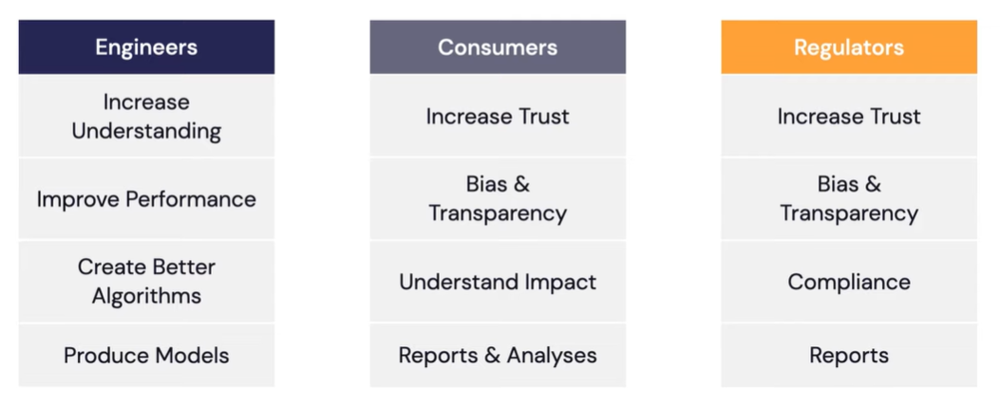

### Feature Importance

In [ ]:
np.array(cat_regressor.get_feature_importance(prettified=True))

### SHAP (SHapley Additive exPlanations)

In [ ]:
#pip install shap

In [ ]:
import shap
from catboost import Pool

shap_values = cat_regressor.get_feature_importance(Pool(X_test, label=y_test), type="ShapValues")
shap_values = shap_values[:,:-1]

In [ ]:
shap.summary_plot(shap_values, X_test)

### LIME (Local Interpretable Model-Agnostic Explanations)

In [ ]:
#pip install lime

In [ ]:
import lime
from lime.lime_tabular import LimeTabularExplainer

# Submission

In [ ]:
submission = pd.read_csv(SAMPLE_SUBMISSION_PATH)

In [ ]:
cat_y_pred = cat_regressor.predict(full_test)
xgb_y_pred = xgb_regressor.predict(full_test)
lgbm_y_pred = lgbm_regressor.predict(full_test)

ensembled_y_pred = (
   ( 0.6 * cat_y_pred ) +
   ( 0.1 * xgb_y_pred ) +
   ( 0.3 * lgbm_y_pred ) 
)

submission['rain_1h'] = ensembled_y_pred
submission['rain_1h'] = submission['rain_1h'].apply(lambda x: 0. if x < 0 else x)
submission.to_csv('submission_radif.csv', index=False)

In [ ]:
sns.scatterplot(data=submission['rain_1h'])

In [ ]:
sns.kdeplot(data=submission['rain_1h'])

In [ ]:
submission['rain_1h'].describe()

## Export

In [ ]:
transformed_train.to_csv('exported_train_radif.csv', index=False)
transformed_test.to_csv('exported_test_radif.csv', index=False)

In [ ]:
import pickle 

pickle.dump(cat_regressor, open('submission_radif.pkl', 'wb'))